### Andrew Janssen, Chun Pong Brian Chan
# CS524: Warehouse Location

#### Introduction
Package delivery has become an important service that many people rely on. There is an increasing demand for same day delivery which creates a need for efficient distribution channels. We consider the problem of choosing where to build warehouses in order to efficiently deliver packages. We also aim to create a model that is resilient to possible fluctuations in its parameters. The model must minimize the cost of building warehouses combined with the price of delivery from chosen warehouses. In our model, we examine a map of UW-Madison and a few surrounding neighborhoods.

#### Approach
In order to generate the data needed to feed into our model, we utilized OpenStreetMaps and Google Maps APIs. In DataGeneration.ipynb we load a .geojson file generated by OpenStreetMaps that contains all geographical locations in our map. 
We manually selected 14 possible warehouse locations from this data. We then use the Google Maps Distance Matrix API to calculate the estimated delivery times in seconds from each warehouse to each building. With this data we first create a basic model to minimize the cost of building warehouses and delivering from the warehouses. Then we convert our basic model into a two stage stochastic model. In the first stage, we examine 9 possible scenarios with different demand and delivery costs and determine what warehouses should be built. In the second stage, we use the warehouses decided in the first stage to calculate which warehouses should deliver to which buildings to minimize cost for some of the scenarios.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm

### Loading data from DataGeneration.ipynb

In [2]:
df = pd.read_csv('buildings.csv', sep='\t')
destinations = list(zip(df.latitudes, df.longitudes))
wf = pd.read_csv('warehouses.csv', sep='\t')
warehouse_destinations = list(zip(wf.latitudes, wf.longitudes))
dist = pd.read_csv('distances.csv', sep='\t')
dist = dist.drop(dist.columns[0], axis=1)

In [3]:
lat, long = zip(*destinations)
wlat, wlong = zip(*warehouse_destinations)
minLong = min(long + wlong)
maxLong = max(long + wlong) 
minLat = min(lat + wlat)
maxLat = max(lat + wlat)
bounds = (minLong, maxLong, minLat, maxLat)
uw_map = plt.imread('uw.png')

### Plotting building locations in blue and possible warehouse locations in red

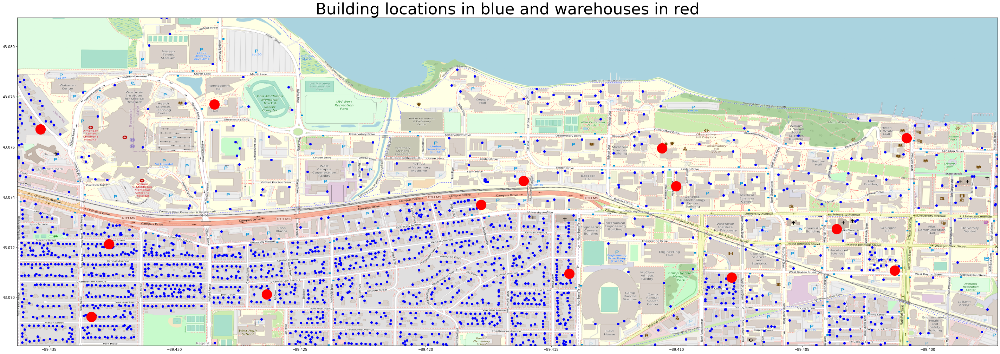

In [4]:
fig, ax = plt.subplots(figsize = (50,50))
ax.scatter(long, lat, color='b', zorder=1)
ax.scatter(wlong, wlat, s = 800, color='r', zorder=1)
ax.set_xlim(bounds[0],bounds[1])
ax.set_ylim(bounds[2],bounds[3])
ax.imshow(uw_map, zorder=0, extent = bounds, origin='upper')
plt.title('Building locations in blue and warehouses in red', fontsize=45)
plt.show()

In [5]:
%reload_ext gams_magic

### Load distance matrix and convert to form suitable for GAMS

In [6]:
def gt_from2dim(df, column_names=None):
    if column_names==None:
        return pd.DataFrame(df.stack()).reset_index()
    else:
        df = pd.DataFrame(df.stack()).reset_index()
        return df.rename(columns=dict(zip(df.columns, column_names)))
    
dist = gt_from2dim(dist, ['b','w'])
dist['b'] = dist['b'].apply(str)
dist['w'] = dist['w'].apply(str)
dist=dist.reindex(columns=['w','b',0])

In [7]:
%gams_reset
%gams set w,b; parameter dist(w,b);

w = [str(x) for x in range(14)]
b = [str(x) for x in range(1728)]

%gams_push w b dist

## Basic model
We are starting with a basic monthly model that assumes constant delivery cost and demand. For package delivery we calculate the cost of a delivery with a basic out and back model.  
  
We let:
* Warehouse mortgage = \\$5000 a month
* Delivery cost      = \\$150 per hour --> \\$150/60/60 per minute
* Maximum deliveries = 200 per day --> 200*30 per month
* Demand             = 10 packages per month

##### Model
* Warehouses: W  
* Buildings: B  
* Delivery cost: deliverycost, b in B, w in W  
* Demand: demand, b in B  
* Warehouse built: built, w in W  
* Build Cost: buildcost

\begin{equation}
  \tag{Cost Equation}
min \sum_{w \in W}^{}{built_w*buildcost} + 2\sum_{w \in W}\sum_{b \in B}{deliver_{wb}*dist_{wb}*deliverycost}
 \label{eqn:Cost}
\end{equation}

\begin{equation}
  \tag{Demand Equation}
\sum_{w \in W}^{}{y_{wb}} = {demand_b}
 \label{eqn:Demand}
\end{equation}

\begin{equation}
  \tag{Deliver Equation}
\sum_{b \in B}^{}{y_{wb}} \geq maxdeliveries
 \label{eqn:Deliver}
\end{equation}

\begin{equation}
  \tag{Equation 1}
{demand_b}*{built_w} \geq {y_{wb}}
 \label{eqn:eq_1}
\end{equation}

\begin{equation}
  \tag{Equation 2}
{deliver_{wb}} - {y_{wb}} \leq {demand_b}*(1-{built_w})
 \label{eqn:eq_2}
\end{equation}

\begin{equation}
  \tag{Equation 3}
{deliver_{wb}} - {y_{wb}} \geq 0
 \label{eqn:eq_3}
\end{equation}

In [8]:
%%gams

option limrow = 0, limcol = 0 ;
option solprint=off;

parameter demand(b);
demand(b) = 10;

scalars
    build_cost /5000/
    delivery_cost /[150/60/60]/
    max_deliveries /[200*30]/
;

free variable cost;

binary variables
    built(w)
;

integer variables
    y(w,b)
    deliver(w, b)
;

equations
    cost_eq
    demand_eq(b)
    deliver_eq(w)
    
    eq_1(w,b)
    eq_2(w,b)
    eq_3(w,b)
;


cost_eq..
    cost =e= sum(w, built(w)*build_cost) +
             sum((w,b), deliver(w,b)*2*dist(w,b)*delivery_cost);

demand_eq(b)..
    sum(w, y(w,b)) =e= demand(b);
    
deliver_eq(w)..
    sum(b,  y(w,b)) =l= max_deliveries;
    
eq_1(w,b)..
    y(w,b) =l= demand(b)*built(w);

eq_2(w,b)..   
    deliver(w,b)-y(w,b) =l= demand(b)*(1-built(w));

eq_3(w,b)..    
    deliver(w,b)-y(w,b) =g= 0;

model basic /all/;
solve basic using mip minimizing cost;

,Solver Status,Model Status,Objective,#equ,#var,Model Type,Solver,Solver Time
0,Normal (1),Optimal Global (1),149240.0,74319,48399,MIP,CPLEX,0.593


### Displaying chosen warehouses from the basic model

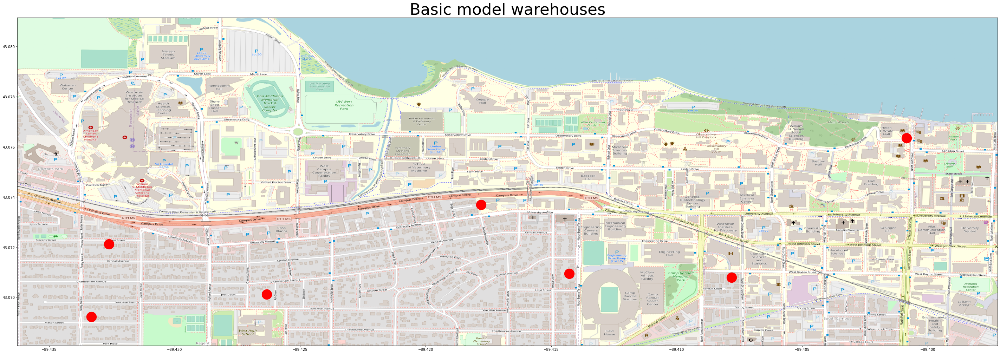

In [9]:
%gams_pull -d built
built_warehouses = built.loc[built['level'] == 1.0].index.tolist()

builtlong = [wlong[i] for i in built_warehouses]
builtlat = [wlat[i] for i in built_warehouses]

fig, ax = plt.subplots(figsize = (50,50))
ax.scatter(builtlong, builtlat, s = 800, color='r', zorder=1)
ax.set_xlim(bounds[0],bounds[1])
ax.set_ylim(bounds[2],bounds[3])
ax.imshow(uw_map, zorder=0, extent = bounds, origin='upper')
plt.title('Basic model warehouses', fontsize=45)
plt.show()

## Two stage stochastic model

### First stage:
We want a model that considers parameter variation to protect against randomness. To accomplish this we consider some possible scenarios. 

##### Market research tells us that number of deliveries depends on the current month
* High delivery (3x) in months: November, December: 2/12 months
* Low delivery (1/2) in months: June, July, Aug: 3/12 months
* Normal delivery rest of year: 7/12 months

##### We want to protect against randomness in the cost of delivery. Gas prices, risk of unionization, and vehicle repairs could change the cost of deliveries
* 35% chance that cost of delivery doubles
* 40% chance that cost of delivery stays the same
* 25% chance that cost of delivery halves

In [10]:
%gams_reset
%gams set w,b; parameter dist(w,b);

w = [str(x) for x in range(14)]
b = [str(x) for x in range(1728)]

%gams_push w b dist

%gams set scen /0*8/;
%gams parameter s_demand(scen); parameter delivery_cost(scen); parameter p(scen);

base_demand = 10
base_delivery = 150/60/60
demand_mult = [.5, 1, 3]
demand_chance = [3/12, 7/12, 2/12]
delivery_mult = [.5, 1, 2]
delivery_chance = [.25, .4, .35]

s_demand = pd.DataFrame(columns=['demand'])
delivery_cost = pd.DataFrame(columns=['deliv'])
p = pd.DataFrame(columns=['chance'])
i = 0
for dem in range(3):
    for deliv in range(3):
        s_demand.loc[i] = [base_demand * demand_mult[dem]]
        delivery_cost.loc[i] = [base_delivery * delivery_mult[deliv]]
        p.loc[i] = [demand_chance[dem] * delivery_chance[deliv]]
        i = i+1
        
s_demand = gt_from2dim(s_demand, ['scen'])
delivery_cost = gt_from2dim(delivery_cost, ['scen'])
p = gt_from2dim(p, ['scen'])
s_demand = s_demand.drop(s_demand.columns[1], axis=1)
delivery_cost = delivery_cost.drop(delivery_cost.columns[1], axis=1)
p = p.drop(p.columns[1], axis=1)
s_demand['scen'] = s_demand['scen'].apply(str)
delivery_cost['scen'] = delivery_cost['scen'].apply(str)
p['scen'] = p['scen'].apply(str)

%gams_push s_demand delivery_cost p

merged = pd.DataFrame(columns=['Scenario','Demand','Delivery Cost', 'Probability'])
merged['Scenario'] = p['scen']
merged['Demand'] = s_demand[0]
merged['Delivery Cost'] = delivery_cost[0]
merged['Probability'] = p[0]
print(merged.to_string(index=False))

Scenario  Demand  Delivery Cost  Probability
       0     5.0       0.020833     0.062500
       1     5.0       0.041667     0.100000
       2     5.0       0.083333     0.087500
       3    10.0       0.020833     0.145833
       4    10.0       0.041667     0.233333
       5    10.0       0.083333     0.204167
       6    30.0       0.020833     0.041667
       7    30.0       0.041667     0.066667
       8    30.0       0.083333     0.058333


### Stochastic model

##### Stochastic model is the same as the basic model except indexed by scenario as well:
* Scenarios: S  
* Probability: p for s in S

\begin{equation}
  \tag{Cost Equation}
min \sum_{s \in S}p_s*(\sum_{w \in W}^{}{built_w*buildcost} + 2\sum_{w \in W}\sum_{b \in B}{deliver_{swb}*dist_{wb}*deliverycost_s})
 \label{eqn:Cost}
\end{equation}

\begin{equation}
  \tag{Demand Equation}
\sum_{w \in W}^{}{y_{swb}} = {demand_{sb}}
 \label{eqn:Demand}
\end{equation}

\begin{equation}
  \tag{Deliver Equation}
\sum_{b \in B}^{}{y_{swb}} \geq maxdeliveries
 \label{eqn:Deliver}
\end{equation}

\begin{equation}
  \tag{Equation 1}
{demand_b}*{built_w} \geq {y_{swb}}
 \label{eqn:eq_1}
\end{equation}

\begin{equation}
  \tag{Equation 2}
{deliver_{swb}} - {y_{swb}} \leq {demand_sb}*(1-{built_w})
 \label{eqn:eq_2}
\end{equation}

\begin{equation}
  \tag{Equation 3}
{deliver_{swb}} - {y_{swb}} \geq 0
 \label{eqn:eq_3}
\end{equation}

In [11]:
%%gams

option limrow = 0, limcol = 0 ;
option solprint=off;

set s(scen);
s(scen) = yes;

scalars
    build_cost /5000/
    max_deliveries /[200*30]/
;

free variable s_cost;

binary variables
    s_built(w)
;

integer variables
    s_y(scen,w,b)
    s_deliver(scen,w,b)
;

equations
    cost_eq
    demand_eq(scen,b)
    deliver_eq(scen,w)
    
    eq_1(scen,w,b)
    eq_2(scen,w,b)
    eq_3(scen,w,b)
;


cost_eq..
    s_cost =e= sum(s, p(s)*(sum(w, s_built(w)*build_cost) +
             sum((w,b), s_deliver(s,w,b)*2*dist(w,b)*delivery_cost(s))));

demand_eq(s,b)..
    sum(w, s_y(s,w,b)) =e= s_demand(s);
    
deliver_eq(s,w)..
    sum(b,  s_y(s,w,b)) =l= max_deliveries;
    
eq_1(s,w,b)..
    s_y(s,w,b) =l= s_demand(s)*s_built(w);

eq_2(s,w,b)..   
    s_deliver(s,w,b)-s_y(s,w,b) =l= s_demand(s)*(1-s_built(w));

eq_3(s,w,b)..    
    s_deliver(s,w,b)-s_y(s,w,b) =g= 0;

model stage1 /all/;
solve stage1 using mip minimizing s_cost;

,Solver Status,Model Status,Objective,#equ,#var,Model Type,Solver,Solver Time
0,Normal (1),Optimal Global (1),218688.0295,668863,435471,MIP,CPLEX,34.063


### Displaying chosen warehouses from stochastic model

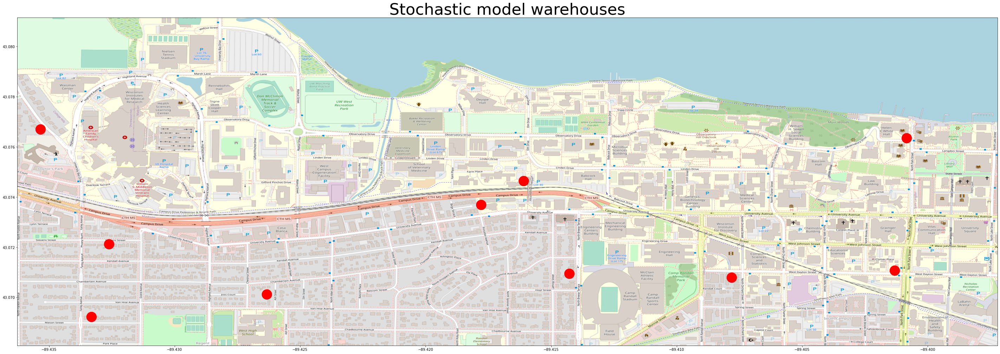

In [12]:
%gams_pull -d s_built s_cost
built_warehouses = s_built.loc[s_built['level'] == 1.0].index.tolist()

builtlong = [wlong[i] for i in built_warehouses]
builtlat = [wlat[i] for i in built_warehouses]

fig, ax = plt.subplots(figsize = (50,50))
ax.scatter(builtlong, builtlat, s = 800, color='r', zorder=1)
ax.set_xlim(bounds[0],bounds[1])
ax.set_ylim(bounds[2],bounds[3])
ax.imshow(uw_map, zorder=0, extent = bounds, origin='upper')
plt.title('Stochastic model warehouses', fontsize=45)
plt.show()

## Second stage: Recourse
Note: We display the package deliveries by marking warehouses with a diamond and the buildings they deliver to with a circle of the same color

##### Assume worst case scenario: 
* High delivery month
* Doubled delivery costs

In [13]:
%%gams

s(scen) = no;
p(scen) = 0;
s('8') = yes;
p('8') = 1;

s_built.fx(w) = s_built.l(w)

model stage2 /all/;
solve stage2 using mip minimizing s_cost;

,Solver Status,Model Status,Objective,#equ,#var,Model Type,Solver,Solver Time
0,Normal (1),Optimal Global (1),824305.0,74319,48399,MIP,CPLEX,0.266


### Displaying packages delivered

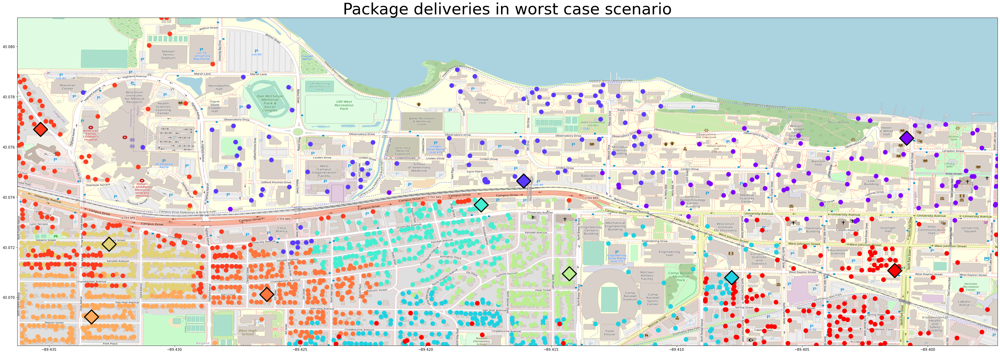

In [14]:
%gams_pull -d s_y

deliveries = s_y.loc[s_y['scen'] == '8']
deliveries = deliveries.loc[deliveries['level'] > 0.0]
delivs = [deliveries.loc[deliveries['w'] == ware]['b'].astype(int).tolist() 
        for ware in [str(x) for x in range(14)]]

colors = cm.rainbow(np.linspace(0, 1, len(delivs)))
fig, ax = plt.subplots(figsize = (50,50))

for index, d, c in zip(range(14),delivs, colors):
    ax.scatter([long[i] for i in d], [lat[i] for i in d],s=150,
               color=c,zorder=1)
    if len(delivs[index]) > 0:
        ax.scatter(wlong[index], wlat[index], marker='D',zorder=2, 
                   edgecolor='black', linewidth=3, s = 800, color=c)
    
ax.set_xlim(bounds[0],bounds[1])
ax.set_ylim(bounds[2],bounds[3])
ax.imshow(uw_map, zorder=0, extent = bounds, origin='upper')
plt.title('Package deliveries in worst case scenario', fontsize=45)
plt.show()

##### Assume best case scenario: 
* Low delivery month
* Lowered delivery costs

In [15]:
%%gams

s(scen) = no;
p(scen) = 0;
s('0') = yes;
p('0') = 1;

s_built.fx(w) = s_built.l(w)

model stage2 /all/;
solve stage2 using mip minimizing s_cost;

,Solver Status,Model Status,Objective,#equ,#var,Model Type,Solver,Solver Time
0,Normal (1),Optimal Global (1),75827.9167,74319,48399,MIP,CPLEX,0.25


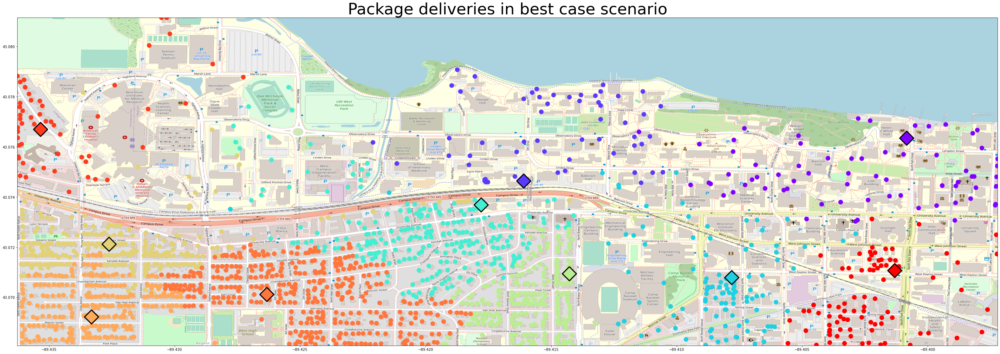

In [16]:
%gams_pull -d s_y

deliveries = s_y.loc[s_y['scen'] == '0']
deliveries = deliveries.loc[deliveries['level'] > 0.0]
delivs = [deliveries.loc[deliveries['w'] == ware]['b'].astype(int).tolist() 
        for ware in [str(x) for x in range(14)]]

colors = cm.rainbow(np.linspace(0, 1, len(delivs)))
fig, ax = plt.subplots(figsize = (50,50))

for index, d, c in zip(range(14),delivs, colors):
    ax.scatter([long[i] for i in d], [lat[i] for i in d],s=150,
               color=c,zorder=1)
    if len(delivs[index]) > 0:
        ax.scatter(wlong[index], wlat[index], marker='D',zorder=2, 
                   edgecolor='black', linewidth=3, s = 800, color=c)
    
ax.set_xlim(bounds[0],bounds[1])
ax.set_ylim(bounds[2],bounds[3])
ax.imshow(uw_map, zorder=0, extent = bounds, origin='upper')
plt.title('Package deliveries in best case scenario', fontsize=45)
plt.show()

##### Assume average case: 
* Average demand
* Average delivery costs

In [17]:
avg_demand = np.round(base_demand*sum(demand_mult[i] * demand_chance[i] for i in range(len(demand_mult))))
avg_deliverycost = base_delivery*sum(delivery_mult[i] * delivery_chance[i] for i in range(len(delivery_mult)))

%gams scalar avg_demand; scalar avg_deliverycost;
%gams_push avg_demand avg_deliverycost

In [18]:
%%gams

s(scen) = no;
p(scen) = 0;
s('0') = yes;
p('0') = 1;

s_demand('0') = avg_demand;
delivery_cost('0') = avg_deliverycost;

s_built.fx(w) = s_built.l(w)

model stage2 /all/;
solve stage2 using mip minimizing s_cost;

,Solver Status,Model Status,Objective,#equ,#var,Model Type,Solver,Solver Time
0,Normal (1),Optimal Global (1),201868.15,74319,48399,MIP,CPLEX,0.266


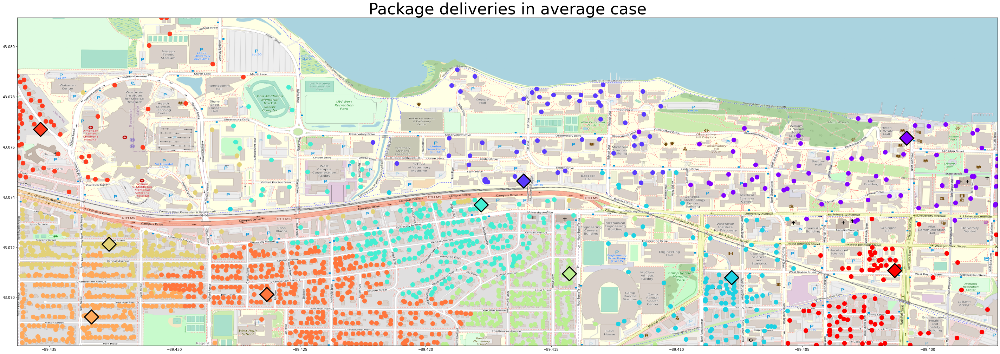

In [19]:
%gams_pull -d s_y s_cost

deliveries = s_y.loc[s_y['scen'] == '0']
deliveries = deliveries.loc[deliveries['level'] > 0.0]
delivs = [deliveries.loc[deliveries['w'] == ware]['b'].astype(int).tolist() 
        for ware in [str(x) for x in range(14)]]

colors = cm.rainbow(np.linspace(0, 1, len(delivs)))
fig, ax = plt.subplots(figsize = (50,50))

for index, d, c in zip(range(14),delivs, colors):
    ax.scatter([long[i] for i in d], [lat[i] for i in d],s=150,
               color=c,zorder=1)
    if len(delivs[index]) > 0:
        ax.scatter(wlong[index], wlat[index], marker='D',zorder=2, 
                   edgecolor='black', linewidth=3, s = 800, color=c)
    
ax.set_xlim(bounds[0],bounds[1])
ax.set_ylim(bounds[2],bounds[3])
ax.imshow(uw_map, zorder=0, extent = bounds, origin='upper')
plt.title('Package deliveries in average case', fontsize=45)
plt.show()

#### Conclusion:
The solution to our model depends on the input parameters. The model must build more warehouses in order to keep up with increasing demand. It must also not build too many warehouses if it does not decrease delivery times enough to offset the building cost.

First stage: The first stage model built 10 warehouses whereas the basic model only built 7. Since some of the scenarios in the stochastic model had greatly increased demand, the maximum delivieries limit and delivery cost became problematic. The warehouses built are clustered more densely in the residential area compared to the University because there are more buildings in those areas

Second stage: The best case scenario deliveries are as expected. Warehouses deliver to buildings closest to them to minimize the delivery costs. In the worst case scenario, some areas of the map look unintuitive. Since demand is three times greater than the basic model, some warehouses hit the maximum delivery limit causing a further warehouse to be needed to make the delivery.

#### Extensions:

We originally planned to do a similar project but with a more complex model for package delivery. However, the model behind it was too challenging and did not seem feasible to execute. We wanted to find the optimal locations for warehouses but with delivery routes instead of an out-and-back model. This would be a better model because it closers matches the reality of package distribution.

Another possible extension on this project would be changing the model to allow for backlogging of package delivery. The delivery limit became problematic with higher demand so a backlogging fee could allow for fewer warehouses to be built if we pay the backlogging fee instead.

In [20]:
%gams_cleanup